# Pretty plots

In [1]:
cd /workspace

/workspace


In [2]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import os

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir='./out/final_plots'
sc.settings.set_figure_params(dpi=100, dpi_save=300,fontsize=12, frameon=False, facecolor='white', format='png',color_map='Reds')

In [3]:
print(sc.settings.figdir)

out/final_plots


In [4]:
adata = sc.read_h5ad('data/MSODB_human.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 1979 × 3000
    obs: 'n_genes', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'S_score', 'G2M_score', 'phase', 'leiden_0.4', 'leiden_0.47', 'leiden_0.5', 'leiden_0.6', 'leiden_0.8', 'leiden_1', 'clusters', 'cell_types'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_types_colors', 'clusters_colors', 'hvg', 'leiden', 'leiden_0.47_colors', 'leiden_0.4_colors', 'leiden_0.5_colors', 'leiden_0.6_colors', 'leiden_0.8_colors', 'leiden_1_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

# Heatmap Top 10 per cluster unbiased

In [6]:
sc.tl.rank_genes_groups(adata,'leiden_0.47', method='wilcoxon')

ranking genes


/usr/local/lib/python3.8/dist-packages/numba/core/dispatcher.py:289: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ContextualVersionConflict((numpy 1.22.0 (/usr/local/lib/python3.8/dist-packages), Requirement.parse('numpy<1.22,>=1.18'), {'numba'}))'.
  entrypoints.init_all()


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [7]:
adata.uns['rank_genes_groups']

{'params': {'groupby': 'leiden_0.47',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': True,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('ANXA2', 'VCAN', 'MKI67', 'TNC', 'BTG1', 'TP53I3'),
            ('CRIM1', 'PLAC9', 'PBK', 'ALPL', 'TSC22D3', 'CDKN1A'),
            ('DKK1', 'HTRA1', 'TOP2A', 'LUM', 'EIF1', 'TYMS'), ...,
            ('PTN', 'CDH2', 'NEAT1', 'C12orf75', 'KAZN', 'CAVIN3'),
            ('ALPL', 'DKK1', 'RPS27L', 'CRIM1', 'THY1', 'EMP3'),
            ('POSTN', 'TXN', 'FTL', 'CAV1', 'FSTL1', 'HSP90B1')],
           dtype=[('Stromal', 'O'), ('Early Chondrocytes', 'O'), ('Cycling', 'O'), ('Osteo-Like', 'O'), ('Hypertrophic Chondrocites', 'O'), ('Cell-cylce Arrested', 'O')]),
 'scores': rec.array([( 15.05304 ,  20.789278,  27.895876,  20.34222 ,  11.379226 , 14.347471),
            ( 14.816051,  20.445597,  27.842606,  19.849379,  10.8271885, 14.080784),
            ( 14.781525,  19.949045,  27.088127,  19.316275,  10.443781 , 14

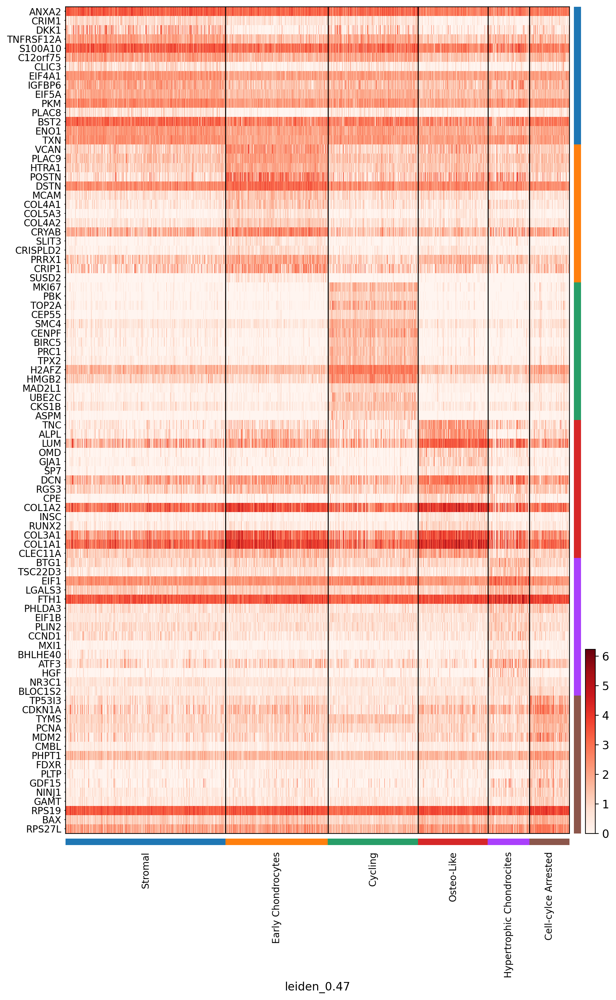

In [8]:
sc.pl.rank_genes_groups_heatmap(adata, n_genes=15,dendrogram=False,show_gene_labels=True, save='rankGenes_Heatmap_MSODB', swap_axes=True)

In [9]:
markerdict={
'Chondro-like' : ['ACAN', 'SOX9', 'COL10A1', 'VEGFA'],
'Stromal' : ['CXCL12','DKK1','VEGFC','SERPINE1','KITLG','ANGPT1','CSF1','IL7','IL7R','VCAM1','IGF1','BMP2','BMP4','JAG1','WNT5A',],
'Stromal_2' : ['MCAM','THY1','PDGFRA','PDGFRB','GREM1'],
'ECM-proteins' : ['COL1A1', 'COL1A2','ECM2'],
'ECM-Glicoproteins' : ['LAMA4', 'LAMA2', 'TNC', 'FN1', 'COL4A1', 'COL4A2'],
'Adipo' : ['PPARG','ADIPOR1','ADIPOR2','PLIN1','PLIN2','LEPR'],
'Osteo':  ['RUNX2','SP7','SPP1','IBSP','ALPL','BGLAP','COL1A1','FN1','TNC','SOST'],
'Cancer' : ['EMP1']
}

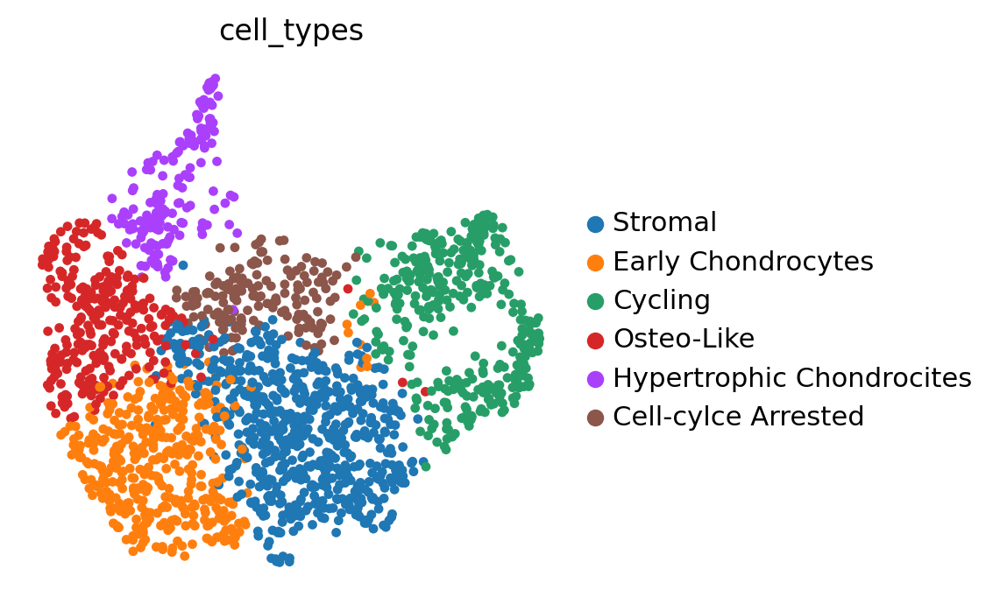

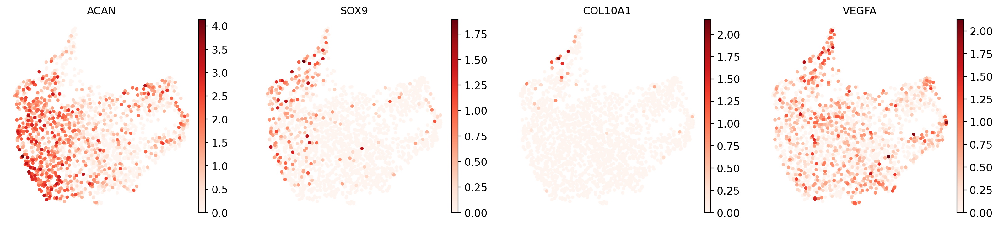

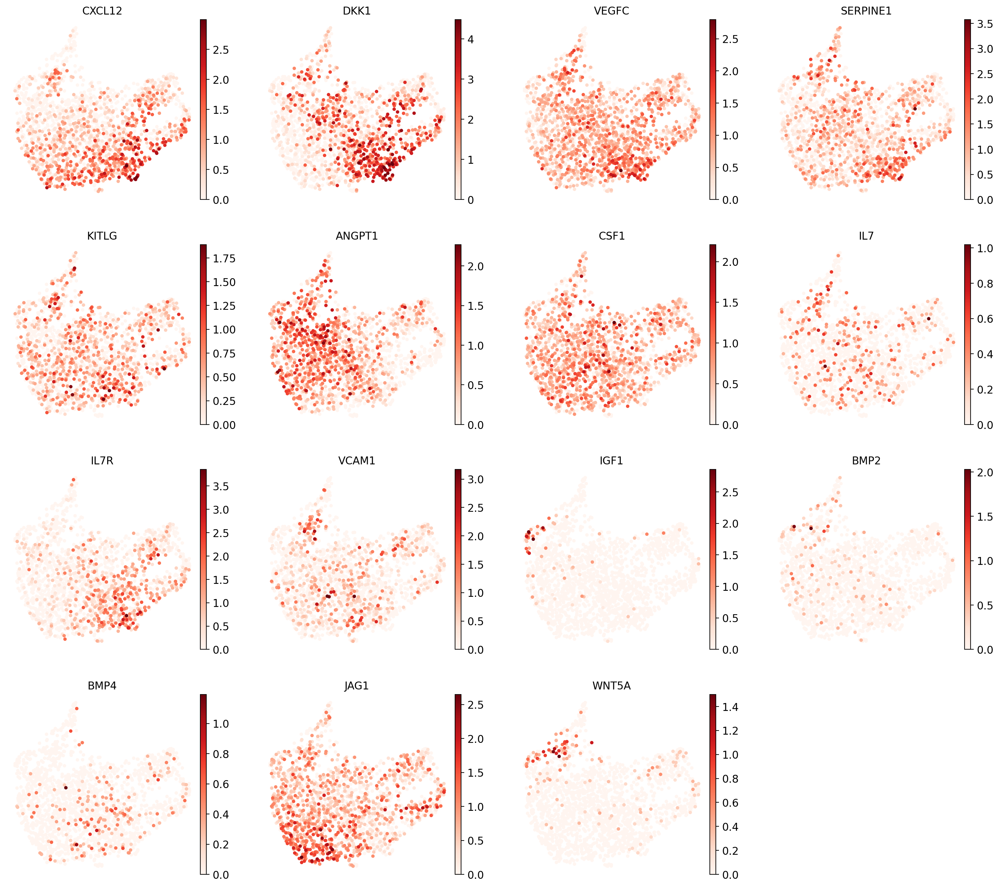

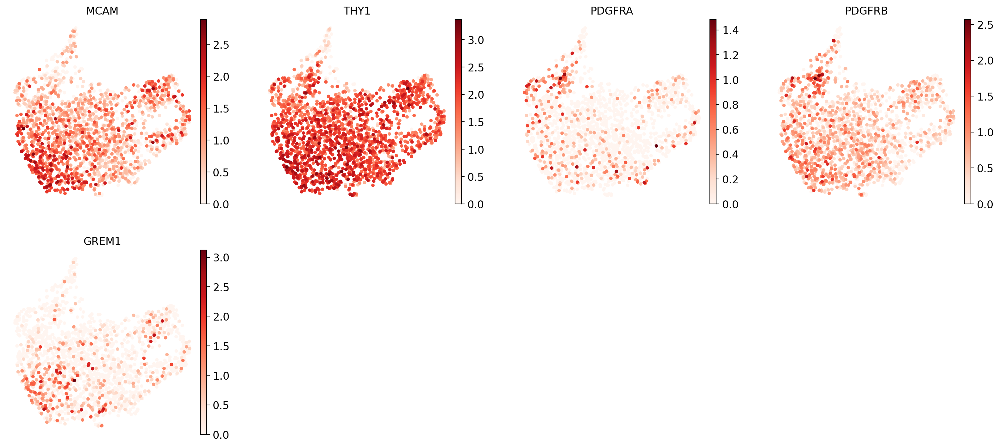

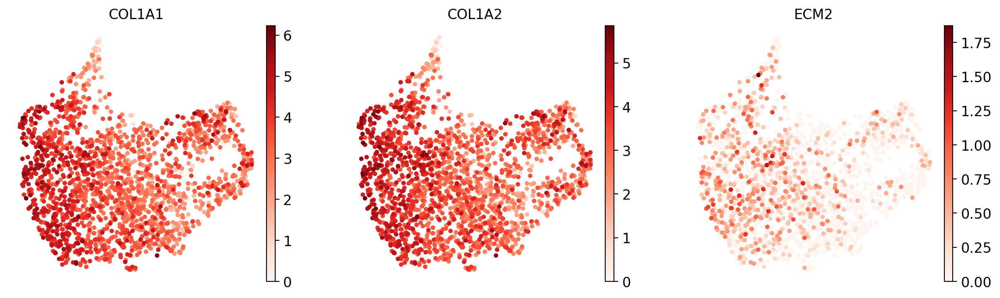

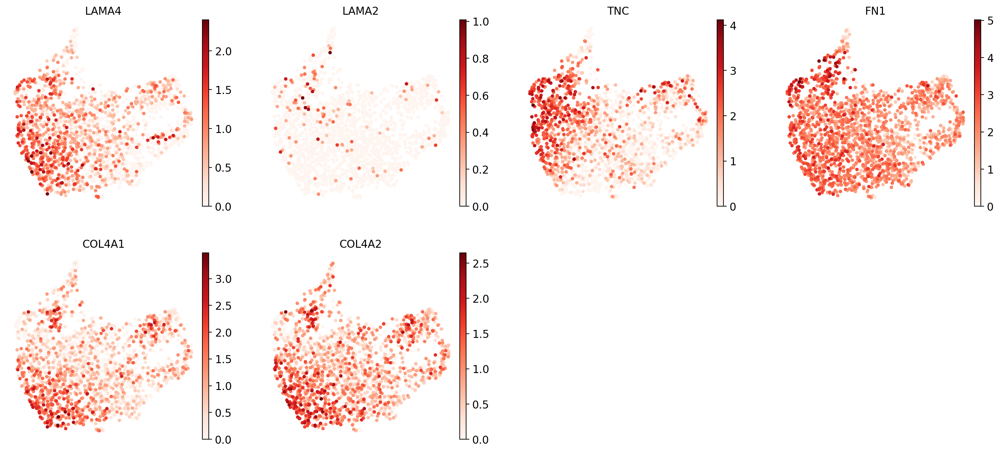

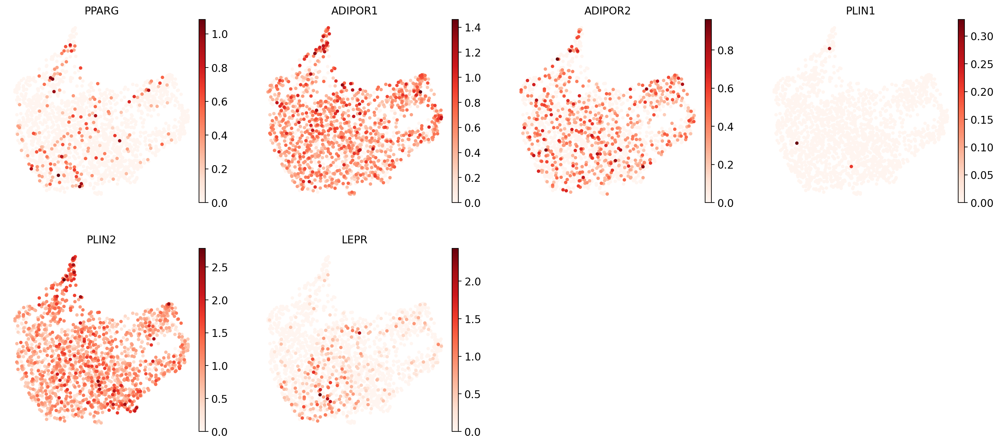

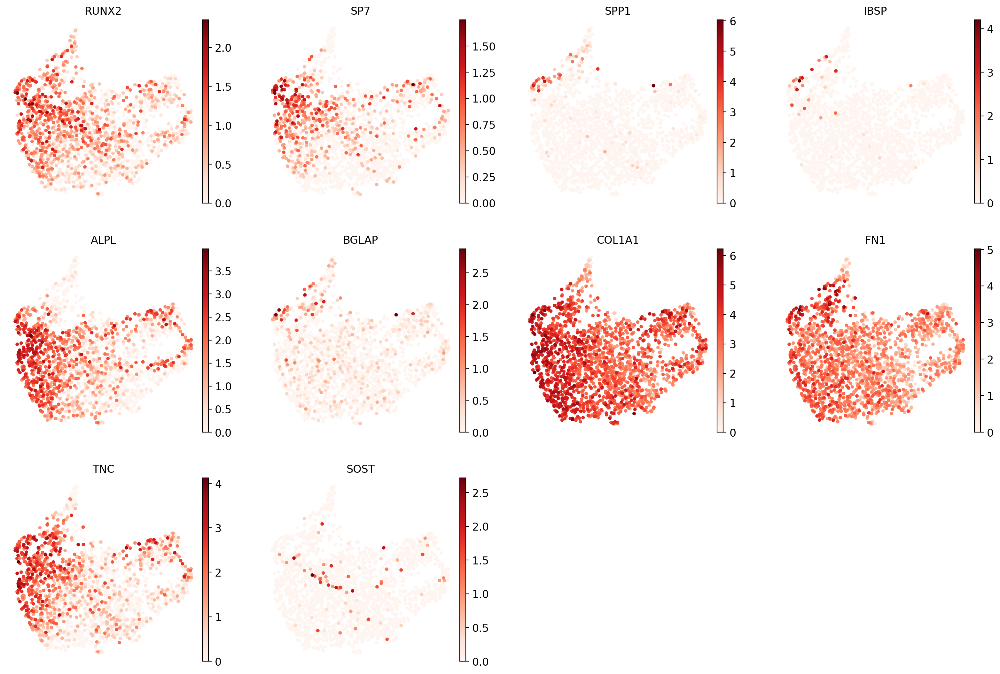

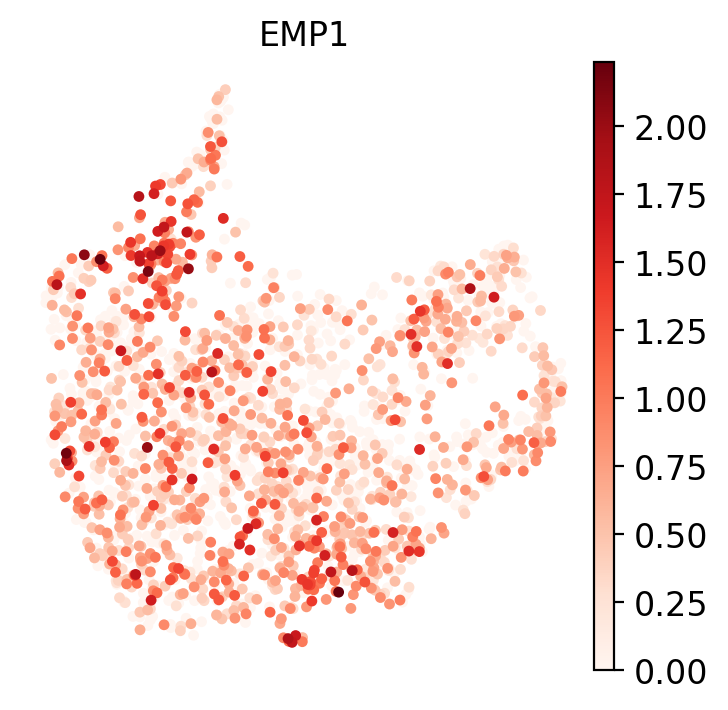

In [10]:
sc.pl.umap(adata, color='cell_types')
for key in markerdict:
    strsave='_'+key+'_MSODB_Final'
    sc.pl.umap(adata, color = markerdict[key],save = strsave)